En esta parte, estamos interesados en ver la temperatura como una serie de timepo, observando como ha cambiado esta a traves del tiempo, por eso estamos interesados en distintas metricas de los datos, primero solo en la temperatura anaual, para todo el planeta y para regiones específicas de este, utilizando serie s de Fourier quermeos observar como es que se comporta el power spectrum de estos datos 

In [2]:
import numpy as np
import xarray as xr
import cf_xarray as cfxr
import cartopy.crs as ccrs
import matplotlib.pyplot as plt
import cartopy.feature as cfeature
from scipy.interpolate import griddata
import regionmask
import pandas as pd
import seaborn as sns
from pydmd import DMD, BOPDMD
from pydmd.plotter import plot_eigs, plot_summary
from pydmd.preprocessing import hankel_preprocessing
from sklearn.preprocessing import StandardScaler
import math
import geopandas as gpd
from shapely.geometry import Point
from shapely.geometry import Polygon
from scipy.spatial import distance_matrix

In [3]:

fN = ("Datos\Land_and_Ocean_EqualArea.nc") 

ds = xr.open_dataset(fN)
years_approx = np.floor(ds['time'])
temp = ds['temperature'].groupby(years_approx).mean('time')
longitude = ds.variables['longitude'][:]  
latitude = ds.variables['latitude'][:]
time = ds.variables['time'][:]
land_mask = ds.variables['land_mask'][:]
temperature = ds.variables['temperature'][:]
climatology = ds.variables['climatology'][:]

In [4]:

# Convertir los datos de temperatura a un DataFrame
temperature_df = pd.read_csv("Datos/temperatura.csv",index_col="time")

# Revisar el resultado para asegurarse de que tiene el formato correcto
temperature_df.head()


,point_1,point_2,point_3,point_4,point_5,point_6,point_7,point_8,point_9,point_10,...,point_15975,point_15976,point_15977,point_15978,point_15979,point_15980,point_15981,point_15982,point_15983,point_15984
time,,,,,,,,,,,,,,,,,,,,,
1850.041667,NaN,NaN,NaN,NaN,NaN,NaN,0.464756,0.681552,0.785687,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1850.125000,NaN,NaN,NaN,NaN,NaN,NaN,-1.490464,-1.236933,-0.806517,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1850.208333,NaN,NaN,NaN,NaN,NaN,NaN,-0.157294,-0.230608,-0.166150,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1850.291667,NaN,NaN,NaN,NaN,NaN,NaN,-0.139167,-0.058191,-0.072071,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1850.375000,NaN,NaN,NaN,NaN,NaN,NaN,-0.878162,-0.964870,-1.003502,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [5]:
# Define las regiones AR6 utilizando regionmask
regions_ar6 = regionmask.defined_regions.ar6.all
temp_regions=pd.read_csv("Datos/temperaturaregionesipcc.csv",index_col="time")
temp_regions.head()

,Region 0,Region 1,Region 2,Region 3,Region 4,Region 5,Region 6,Region 7,Region 8,Region 9,...,Region 48,Region 49,Region 50,Region 51,Region 52,Region 53,Region 54,Region 55,Region 56,Region 57
time,,,,,,,,,,,,,,,,,,,,,
1850.041667,0.136235,-1.330789,0.008371,-1.081719,1.557231,1.357871,0.177940,0.005466,-0.013133,-0.725280,...,-0.754152,0.052812,-0.122649,-0.443389,-0.459247,-0.106958,-0.059162,-0.013802,-0.037105,-0.228845
1850.125000,-2.766186,0.903567,0.457267,-1.672187,-0.238511,0.841829,-0.398261,0.037664,-0.005968,-0.345103,...,-0.929530,0.314541,-0.209424,-0.341581,-1.092278,-0.146366,0.671129,0.367911,0.032516,-0.330520
1850.208333,-0.290138,-1.243747,-0.128986,-2.131074,-1.220055,-0.509307,-0.421122,0.153145,-0.047957,-0.186628,...,-0.766979,-0.177736,-0.228850,-0.490354,-0.456664,-0.462185,-0.215787,-0.304528,-0.054666,0.138855
1850.291667,0.248451,-1.428141,-1.840282,-0.240155,-3.188819,-1.529099,-0.744390,-0.017132,-0.094589,-0.157292,...,-0.403917,-0.471322,-0.146334,-0.470825,-0.542606,-0.543796,-0.349228,-0.271987,-0.158646,0.081552
1850.375000,0.256227,-1.246234,-1.437419,-0.391208,-1.781213,-1.727687,-1.144015,0.459868,0.275922,-0.132240,...,0.048388,-0.553649,0.094990,-0.382022,-0.085905,-0.260265,-0.337365,-0.180721,-0.149693,-0.609608


In [6]:

land_mask_values = ds['land_mask'].values
# Intentar nuevamente analizar el 'land_mask'
unique_land_mask_values = np.unique(land_mask_values)
unique_land_mask_values

# Usar el valor entero (parte entera) de los tiempos flotantes como aproximación a "año"
# Esto asume que el año está representado directamente como un número flotante
dates = np.floor(ds['time'])

# Agrupar por estos años aproximados y calcular la media de la temperatura
temp = ds['temperature'].groupby(years_approx).mean('time')


# Separar las temperaturas en tierra y mar basándose en el 'land_mask'
# Considerar cualquier valor de 'land_mask' > 0 como tierra
is_land = land_mask_values > 0

# Temperaturas donde es tierra
temperature_land = ds['temperature'].where(is_land)

# Temperaturas donde es mar (negación de is_land)
temperature_sea = ds['temperature'].where(~is_land)

# Calcular la temperatura media anual para tierra y mar
annual_mean_temperature_land = temperature_land.groupby(dates).mean(dim=['time', 'map_points'])
annual_mean_temperature_sea = temperature_sea.groupby(dates).mean(dim=['time', 'map_points'])
# Calcular la desviación anual para tierra y mar
annual_std_temperature_land = temperature_land.groupby(dates).std(dim=['time', 'map_points'])
annual_std_temperature_sea = temperature_sea.groupby(dates).std(dim=['time', 'map_points'])
# Calcular la var anual para tierra y mar
annual_var_temperature_land = temperature_land.groupby(dates).var(dim=['time', 'map_points'])
annual_var_temperature_sea = temperature_sea.groupby(dates).var(dim=['time', 'map_points'])
annual_mean_temperature_land, annual_mean_temperature_sea


(<xarray.DataArray 'temperature' (time: 175)> Size: 700B
 array([-0.6116513 , -0.39715376, -0.47131598, -0.46754357, -0.34948713,
        -0.4413031 , -0.47487193, -0.7085741 , -0.42646918, -0.22443046,
        -0.56777054, -0.64176524, -0.9526564 , -0.35228318, -0.54712564,
        -0.35908064, -0.30264416, -0.19803175, -0.3843545 , -0.17906176,
        -0.3883681 , -0.4960546 , -0.3950557 , -0.2930972 , -0.19983791,
        -0.5749346 , -0.4199104 , -0.03559515,  0.28798628, -0.32406768,
        -0.4399538 , -0.23830725, -0.3737743 , -0.46876946, -0.66265595,
        -0.5442405 , -0.52421963, -0.5807033 , -0.38082722, -0.17662732,
        -0.52965444, -0.46818283, -0.45980513, -0.44748312, -0.35957053,
        -0.337237  , -0.28654888, -0.18221706, -0.36105296, -0.1542841 ,
        -0.00983609, -0.0572198 , -0.31903154, -0.3496894 , -0.47634688,
        -0.332733  , -0.1995229 , -0.5578545 , -0.39380157, -0.39708263,
        -0.37141582, -0.41177544, -0.41592464, -0.3353899 , -0.0640

In [7]:
import plotly.graph_objects as go
import numpy as np
temperature_mean = temperature_df.mean(axis=1)
# Calcular la media móvil de 12 años y la desviación estándar móvil
moving_average = temperature_mean.rolling(window=12).mean()
moving_std = temperature_mean.std()

# Calcular el intervalo de confianza del 95% para la media móvil
confidence_interval_upper = moving_average + 1.96 * moving_std / np.sqrt(12)
confidence_interval_lower = moving_average - 1.96 * moving_std / np.sqrt(12)

# Crear la gráfica base con la temperatura media
fig = go.Figure()

# Añadir la media móvil de 12 años
fig.add_trace(go.Scatter(x=temperature_mean.index, y=moving_average, mode='lines', name='Media Móvil 12 Años'))

# Añadir el intervalo de confianza como una región sombreada
fig.add_trace(go.Scatter(x=temperature_mean.index.tolist() + temperature_mean.index.tolist()[::-1],
                         y=confidence_interval_upper.tolist() + confidence_interval_lower.tolist()[::-1],
                         fill='toself', fillcolor='rgba(0,100,80,0.2)',
                         line=dict(color='rgba(255,255,255,0)'),
                         name='Intervalo de Confianza 95%'))

# Añadir la serie de temperatura promedio original para referencia
fig.add_trace(go.Scatter(x=temperature_mean.index, y=temperature_mean, mode='lines', name='Temperatura Promedio', line=dict(color='gray', dash='dash')))

# Actualizar el layout de la gráfica
fig.update_layout(title='Temperatura Promedio y Media Móvil de 12 Años con Intervalo de Confianza',
                  xaxis_title='Tiempo', yaxis_title='Temperatura Promedio (°C)',
                  legend=dict(yanchor="top", y=0.99, xanchor="left", x=0.01))

# Mostrar la gráfica
fig.show()


C:\Users\danie\AppData\Local\Temp\ipykernel_24656\3465029024.py:27: MatplotlibDeprecationWarning:

The 'use_line_collection' parameter of stem() was deprecated in Matplotlib 3.6 and will be removed two minor releases later. If any parameter follows 'use_line_collection', they should be passed as keyword, not positionally.



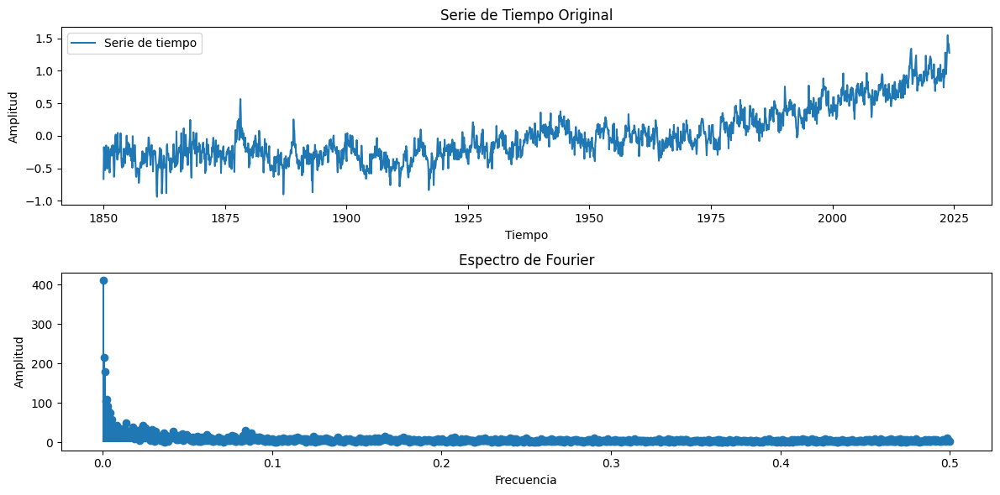

In [8]:
import numpy as np
import matplotlib.pyplot as plt

# Generar una serie de tiempo de ejemplo
t = np.linspace(0, 2*np.pi, 400)
serie_tiempo = np.sin(t) + 0.5*np.sin(2*t) + 0.2*np.sin(3*t)

# Calcular la Transformada de Fourier Discreta
fourier_transform = np.fft.fft(temperature_mean)
frequencies = np.fft.fftfreq(len(temperature_mean), d=1)

# Obtener las amplitudes y filtrar frecuencias positivas
amplitudes = np.abs(fourier_transform)
positive_frequencies = frequencies > 0

# Graficar la serie de tiempo original
plt.figure(figsize=(12, 6))
plt.subplot(2, 1, 1)
plt.plot( temperature_mean, label="Serie de tiempo")
plt.title("Serie de Tiempo Original")
plt.xlabel("Tiempo")
plt.ylabel("Amplitud")
plt.legend()

# Graficar el espectro de Fourier
plt.subplot(2, 1, 2)
plt.stem(frequencies[positive_frequencies], amplitudes[positive_frequencies], basefmt=" ", use_line_collection=True)
plt.title("Espectro de Fourier")
plt.xlabel("Frecuencia")
plt.ylabel("Amplitud")
plt.tight_layout()
plt.show()


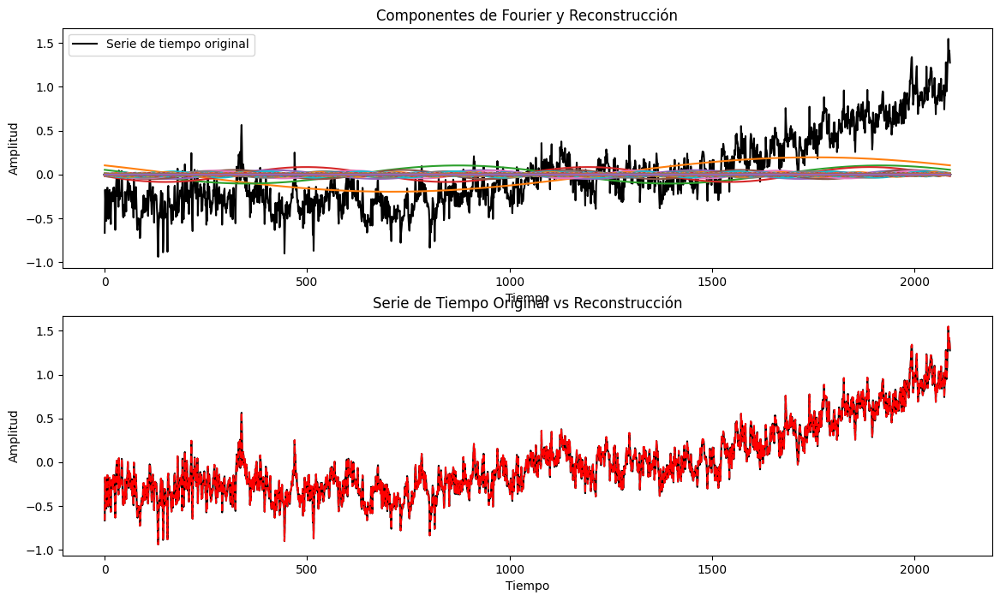

In [9]:
import numpy as np
import matplotlib.pyplot as plt

# Asumiendo que tienes un array 'temperature_mean' con tus datos de temperatura
# Generar una variable de tiempo t que coincida con el tamaño de 'temperature_mean'
t = np.arange(len(temperature_mean))

# Calcular la Transformada de Fourier Discreta
fourier_transform = np.fft.fft(temperature_mean)
n = temperature_mean.size
frequencies = np.fft.fftfreq(n, d=1)  # Asumiendo que el paso de tiempo entre datos es 1

# Preparar la reconstrucción de la serie de tiempo a partir de los componentes de Fourier
reconstruccion = np.zeros_like(temperature_mean)

# Graficar la serie de tiempo original
plt.figure(figsize=(14, 8))
plt.subplot(2, 1, 1)
plt.plot(t, temperature_mean, label="Serie de tiempo original", color='black')
plt.title("Componentes de Fourier y Reconstrucción")
plt.xlabel("Tiempo")
plt.ylabel("Amplitud")
plt.legend()

# Graficar cada componente y sumar para la reconstrucción
for idx, freq in enumerate(frequencies):
    if idx <= n // 2 and np.abs(fourier_transform[idx]) > 1e-10:  # Filtrar componentes irrelevantes
        amplitude = np.abs(fourier_transform[idx]) / n
        phase = np.angle(fourier_transform[idx])
        componente = amplitude * np.cos(2 * np.pi * freq * t + phase)
        reconstruccion += componente * 2  # Sumar el doble de cada componente porque la mitad va para frecuencias negativas
        plt.plot(t, componente)  # Etiquetar solo algunos para evitar saturación

plt.legend()

# Graficar la reconstrucción
plt.subplot(2, 1, 2)
plt.plot(t, temperature_mean, label="Serie de tiempo original", color='black')
plt.plot(t, reconstruccion, label="Reconstrucción", linestyle='--', color='red')
plt.title("Serie de Tiempo Original vs Reconstrucción")
plt.xlabel("Tiempo")
plt.ylabel("Amplitud")
#plt.legend()
#plt.tight_layout()
plt.show()


C:\Users\danie\AppData\Local\Temp\ipykernel_24656\883929438.py:22: UserWarning:

Attempt to set non-positive xlim on a log-scaled axis will be ignored.



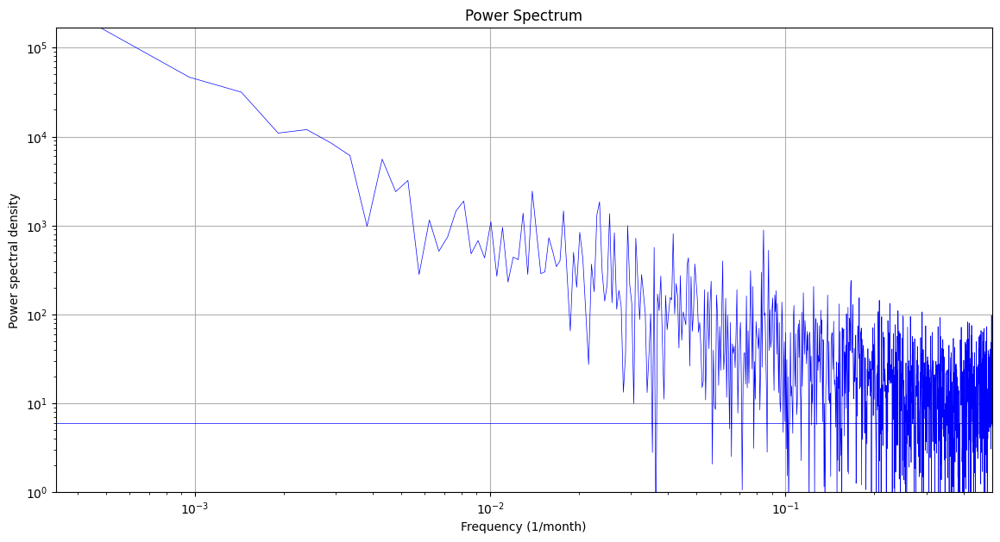

In [10]:
# Calcular la transformada rápida de Fourier (FFT) y las frecuencias
fft_result = np.fft.fft(temperature_mean)
frequencies = np.fft.fftfreq(len(temperature_mean), d=1)  # Asume que los datos son mensuales

# Calcular el espectro de potencia (magnitud al cuadrado)
power_spectrum = np.abs(fft_result) ** 2

# Preparar el gráfico en escala log-log
plt.figure(figsize=(14, 7))
plt.loglog(frequencies, power_spectrum, 'b-', linewidth=0.5)  # Línea del espectro

# Resaltar áreas específicas del espectro (necesitarás definir 'mid_scales' y 'short_scales')
#plt.axvline(x=mid_scales, color='red', linestyle='--')
#plt.axvline(x=short_scales, color='black', linestyle='--')

# Agregar anotaciones (necesitarás ajustar las posiciones 'x' y 'y' según tus datos)
#plt.text(x1, y1, 'Seasonal cycle', ha='center', va='center', rotation='vertical')
#plt.text(x2, y2, 'Mid scales', ha='center', va='center', rotation='vertical')
#plt.text(x3, y3, 'Short scales', ha='center', va='center', rotation='vertical')

# Ajustar los límites y etiquetas de los ejes
plt.xlim([frequencies.min(), frequencies.max()])
plt.ylim([1, power_spectrum.max()])
plt.xlabel('Frequency (1/month)')
plt.ylabel('Power spectral density')
plt.title('Power Spectrum')

# Mostrar la grilla
plt.grid(True)

# Mostrar el gráfico
plt.show()


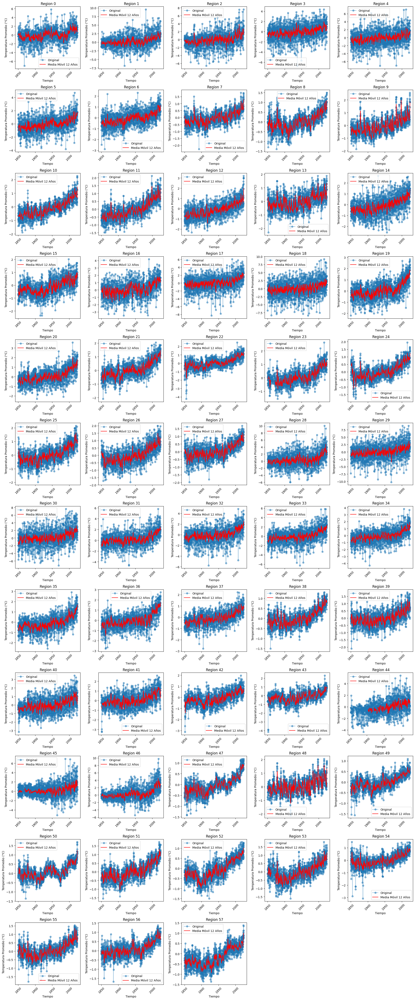

In [11]:


# Número de gráficas por fila
plots_per_row = 5

# Calcular el número total de filas necesarias
num_regions = len(temp_regions.columns)
total_rows = math.ceil(num_regions / plots_per_row)

# Crear una figura para acomodar todas las subgráficas
plt.figure(figsize=(20, total_rows * 4))  # Ajusta el tamaño de la figura según necesites

for i, column in enumerate(temp_regions.columns, start=1):
    ax = plt.subplot(total_rows, plots_per_row, i)
    
    # Plotear la serie de tiempo original
    ax.plot(temp_regions.index, temp_regions[column], label='Original', marker='o', linestyle='-', alpha=0.5)
    
    # Calcular y plotear la media móvil de 12 años
    moving_average = temp_regions[column].rolling(window=12).mean()
    ax.plot(temp_regions.index, moving_average, label='Media Móvil 12 Años', color='red', linestyle='-')
    
    # Configurar título, leyendas y ejes para cada subgráfico
    ax.set_title(f' {column}')
    ax.set_xlabel('Tiempo')
    ax.set_ylabel('Temperatura Promedio (°C)')
    ax.legend()
    plt.xticks(rotation=45)

# Ajustar el layout para asegurar que no haya superposición de gráficos
plt.tight_layout()
plt.show()


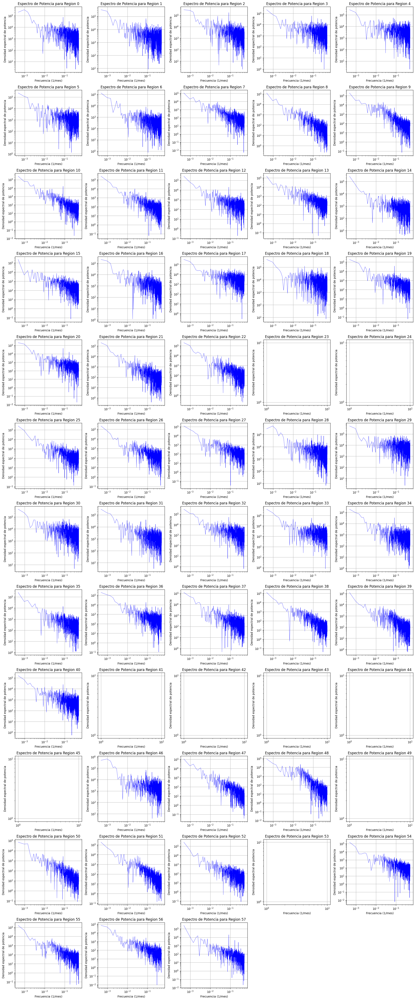

In [12]:
import numpy as np
import matplotlib.pyplot as plt
import math

# Número de gráficas por fila
plots_per_row = 5

# Calcular el número total de filas necesarias
num_regions = len(temp_regions.columns)
total_rows = math.ceil(num_regions / plots_per_row)

# Crear una figura para acomodar todas las subgráficas
plt.figure(figsize=(20, total_rows * 4))  # Ajusta el tamaño de la figura según necesites

for i, column in enumerate(temp_regions.columns, start=1):
    ax = plt.subplot(total_rows, plots_per_row, i)
    
    # Datos de la región actual
    region_data = temp_regions[column]
    
    # Calcular la transformada rápida de Fourier (FFT) y las frecuencias
    fft_result = np.fft.fft(region_data)
    frequencies = np.fft.fftfreq(len(region_data), d=1)  # Asume que los datos son mensuales
    
    # Calcular el espectro de potencia (magnitud al cuadrado)
    power_spectrum = np.abs(fft_result) ** 2
    
    # Graficar el espectro de potencia en escala log-log
    ax.loglog(frequencies[frequencies > 0], power_spectrum[frequencies > 0], 'b-', linewidth=0.5)  # Filtra solo frecuencias positivas

    # Configurar título, leyendas y ejes para cada subgráfico
    ax.set_title(f'Espectro de Potencia para {column}')
    ax.set_xlabel('Frecuencia (1/mes)')
    ax.set_ylabel('Densidad espectral de potencia')
    ax.grid(True)

# Ajustar el layout para asegurar que no haya superposición de gráficos
plt.tight_layout()
plt.show()


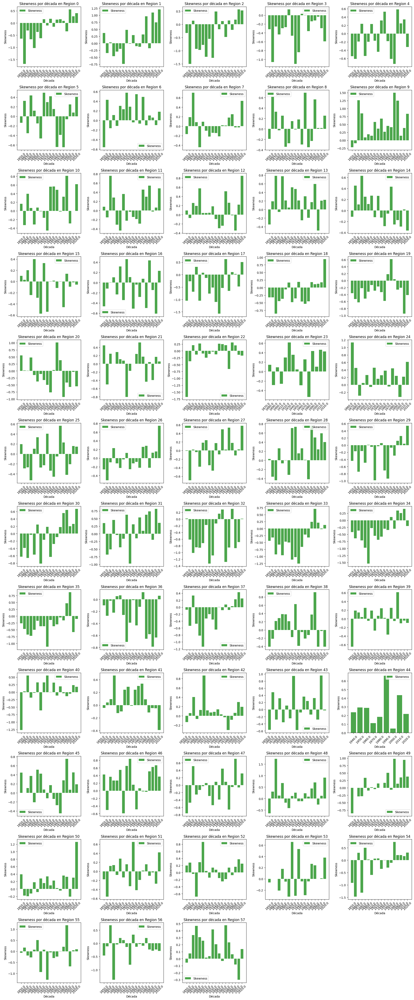

In [13]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import math
from scipy.stats import skew
# Suponiendo que temp_regions es un DataFrame donde las columnas son las regiones
# y los índices son objetos de fecha (DateTimeIndex) de pandas.

# Número de gráficas por fila
plots_per_row = 5

# Calcular el número total de filas necesarias
num_regions = len(temp_regions.columns)
total_rows = math.ceil(num_regions / plots_per_row)

# Crear una figura para acomodar todas las subgráficas
plt.figure(figsize=(20, total_rows * 4))  # Ajusta el tamaño de la figura según necesites

# Calcular el skewness para cada década en cada región
for i, column in enumerate(temp_regions.columns, start=1):
    ax = plt.subplot(total_rows, plots_per_row, i)
    
    # Agrupar por década y calcular skewness
    # Suponemos que el índice es un DateTimeIndex, permite agrupar por década
    decades = (temp_regions.index // 10) * 10
    skewness_by_decade = temp_regions[column].groupby(decades).apply(skew)

    # Plotear el skewness por década
    ax.bar(skewness_by_decade.index.astype(str), skewness_by_decade.values, label='Skewness', color='green', alpha=0.7)
    
    # Configurar título, leyendas y ejes para cada subgráfico
    ax.set_title(f'Skewness por década en {column}')
    ax.set_xlabel('Década')
    ax.set_ylabel('Skewness')
    ax.legend()
    plt.xticks(rotation=45)  # Puede ser necesario ajustar dependiendo del formato de fecha

# Ajustar el layout para asegurar que no haya superposición de gráficos
plt.tight_layout()
plt.show()


[legend.py:1236 -   _parse_legend_args() ] No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
[legend.py:1236 -   _parse_legend_args() ] No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
[legend.py:1236 -   _parse_legend_args() ] No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
[legend.py:1236 -   _parse_legend_args() ] No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
[legend.py:1236 -   _parse_legend_args() ] No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


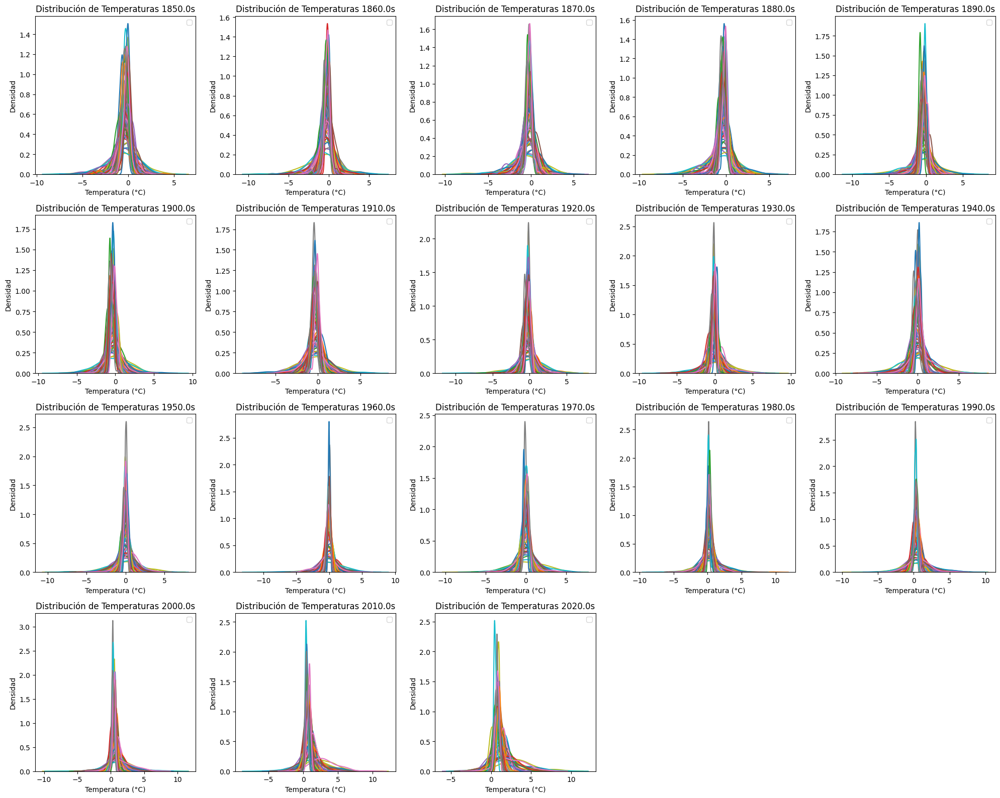

In [14]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import math
from scipy.stats import skew

# Asumiendo que 'temp_regions' es un DataFrame con los índices de tipo DateTimeIndex y las columnas son las regiones

# Número de gráficas por fila
plots_per_row = 5

# Calcular el número total de filas necesarias para cada década
decades = (temp_regions.index // 10) * 10
unique_decades = np.unique(decades)
total_rows = math.ceil(len(unique_decades) / plots_per_row)

# Crear una figura para acomodar todas las subgráficas
plt.figure(figsize=(20, total_rows * 4))

# Iterar sobre cada década y calcular la asimetría
for i, decade in enumerate(unique_decades, start=1):
    ax = plt.subplot(total_rows, plots_per_row, i)
    # Filtrar los datos para la década actual
    data_decade = temp_regions[decades == decade]
    
    # Podemos usar seaborn para plotear la KDE de todas las regiones juntas
    for column in temp_regions.columns:
        sns.kdeplot(data_decade[column], ax=ax, 
                    #label=f'{column} skew: {skew(data_decade[column].dropna()):.2f}'
                    )
    
    # Configurar título, leyendas y ejes para cada subgráfico
    ax.set_title(f'Distribución de Temperaturas {decade}s')
    ax.set_xlabel('Temperatura (°C)')
    ax.set_ylabel('Densidad')
    ax.legend()

# Ajustar el layout para asegurar que no haya superposición de gráficos
plt.tight_layout()
plt.show()


[legend.py:1236 -   _parse_legend_args() ] No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
[legend.py:1236 -   _parse_legend_args() ] No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
[legend.py:1236 -   _parse_legend_args() ] No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
[legend.py:1236 -   _parse_legend_args() ] No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
[legend.py:1236 -   _parse_legend_args() ] No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


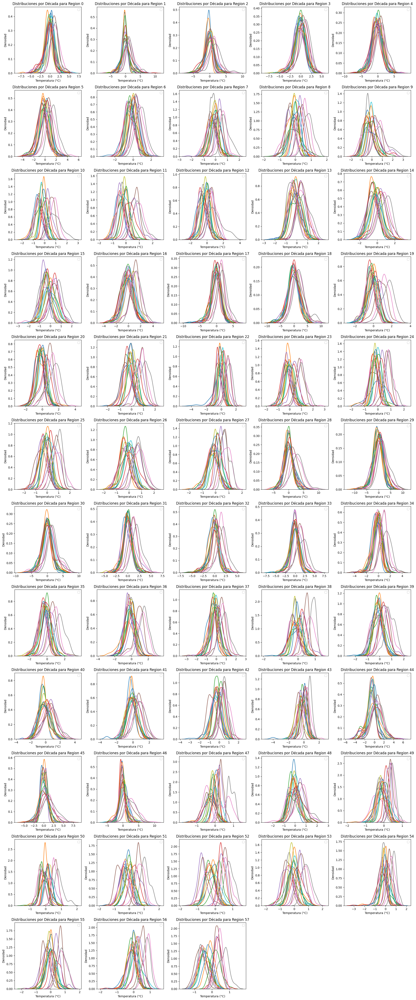

In [15]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import math

# Asumiendo que 'temp_regions' es un DataFrame con índices de tipo DateTimeIndex y las columnas son las regiones

# Número de gráficas por fila
plots_per_row = 5

# Calcular el número total de filas necesarias
num_regions = len(temp_regions.columns)
total_rows = math.ceil(num_regions / plots_per_row)

# Crear una figura para acomodar todas las subgráficas
plt.figure(figsize=(20, total_rows * 4))

# Calcular las décadas presentes en los datos
decades = (temp_regions.index // 10) * 10
unique_decades = np.unique(decades)

# Iterar sobre cada región para crear una subgráfica
for i, column in enumerate(temp_regions.columns, start=1):
    ax = plt.subplot(total_rows, plots_per_row, i)
    
    # Plotear la distribución de cada década dentro de la región
    for decade in unique_decades:
        # Filtrar los datos para la década actual
        data_decade = temp_regions.loc[decades == decade, column].dropna()
        sns.kdeplot(data_decade, ax=ax
                    #, label=f'{decade}s'
                    )

    # Configurar título, leyendas y ejes para cada subgráfico
    ax.set_title(f'Distribuciones por Década para {column}')
    ax.set_xlabel('Temperatura (°C)')
    ax.set_ylabel('Densidad')
    ax.legend()

# Ajustar el layout para asegurar que no haya superposición de gráficos
plt.tight_layout()
plt.show()


In [44]:
import requests
import pandas as pd
from io import StringIO

url = "https://berkeley-earth-temperature.s3.us-west-1.amazonaws.com/Global/Complete_TAVG_daily.txt"

# Hacemos la solicitud al URL
response = requests.get(url)

# Verificamos que la respuesta sea exitosa
if response.status_code == 200:
    # Convertimos el texto de la respuesta en un objeto StringIO
    data = StringIO(response.text)
    
    # Definimos los nombres de las columnas según la descripción de los datos
    column_names = ['Date Number', 'Year', 'Month', 'Day', 'Day of Year', 'Anomaly']
    
    # Utilizamos pandas para leer los datos de formato de ancho fijo
    df = pd.read_fwf(data, colspecs='infer', names=column_names, skiprows=23)  # Asumimos que las primeras 22 líneas son metadatos
    print(df.head())  # Imprimimos las primeras filas para verificar
else:
    print("Error al descargar el archivo, código de estado:", response.status_code)



   Date Number  Year  Month  Day  Day of Year  Anomaly
0     1880.001  1880      1    1            1   -0.692
1     1880.004  1880      1    2            2   -0.592
2     1880.007  1880      1    3            3   -0.673
3     1880.010  1880      1    4            4   -0.615
4     1880.012  1880      1    5            5   -0.681


In [54]:
df.head()

,Date Number,Year,Month,Day,Day of Year,Anomaly
0,1880.001,1880,1,1,1,-0.692
1,1880.004,1880,1,2,2,-0.592
2,1880.007,1880,1,3,3,-0.673
3,1880.010,1880,1,4,4,-0.615
4,1880.012,1880,1,5,5,-0.681


In [57]:
# Ahora, vamos a simular más datos para varios años para poder realizar análisis más significativo
# Vamos a replicar los mismos valores, cambiando solo el año para simplificar la creación del ejemplo
additional_years = pd.concat([df.assign(Year=df['Year'] + i) for i in range(1, 10)], ignore_index=True)

# Concatenar los datos originales con los nuevos datos
df_full = pd.concat([df, additional_years], ignore_index=True)

# Calcular la media de anomalías por año
annual_mean_anomalies = df_full.groupby('Year')['Anomaly'].mean().reset_index()

annual_mean_anomalies.head()

,Year,Anomaly
0,1880,-0.594443
1,1881,-0.464710
2,1882,-0.467628
3,1883,-0.499413
4,1884,-0.557249


In [58]:
# Crear una nueva columna con los valores del año siguiente
annual_mean_anomalies['Next Year Anomaly'] = annual_mean_anomalies['Anomaly'].shift(-1)

# Calcular la correlación entre los valores de anomalía de un año y el siguiente
correlation = annual_mean_anomalies['Anomaly'].corr(annual_mean_anomalies['Next Year Anomaly'])

annual_mean_anomalies, correlation

(     Year   Anomaly  Next Year Anomaly
 0    1880 -0.594443          -0.464710
 1    1881 -0.464710          -0.467628
 2    1882 -0.467628          -0.499413
 3    1883 -0.499413          -0.557249
 4    1884 -0.557249          -0.568041
 ..    ...       ...                ...
 147  2027  1.300362           1.347127
 148  2028  1.347127           1.354686
 149  2029  1.354686           1.282470
 150  2030  1.282470           1.359943
 151  2031  1.359943                NaN
 
 [152 rows x 3 columns],
 0.9987194771454063)

In [61]:
import pandas as pd
import plotly.express as px

# Suponiendo que df es tu DataFrame original
# Calcular la media de anomalías por año
annual_mean_anomalies = df.groupby('Year')['Anomaly'].mean().reset_index()

# Crear una nueva columna con los valores del año siguiente
annual_mean_anomalies['Next Year Anomaly'] = annual_mean_anomalies['Anomaly'].shift(-1)

# Asegurarse de que los datos están completos para el gráfico
annual_mean_anomalies.dropna(inplace=True)

# Calcular la correlación
correlation = annual_mean_anomalies['Anomaly'].corr(annual_mean_anomalies['Next Year Anomaly'])
print("Correlación entre la anomalía de un año y el siguiente:", correlation)

# Graficar con Plotly, incluyendo el año como parte de las etiquetas del hover
fig = px.scatter(annual_mean_anomalies, x='Anomaly', y='Next Year Anomaly',
                 hover_data={'Year': True},  # Esto muestra el año en el hover
                 title=f'Scatter Plot de Anomalías por Año vs. Siguiente Año (Correlación: {correlation:.2f})',
                 labels={'Anomaly': 'Anomalía Promedio del Año Actual', 'Next Year Anomaly': 'Anomalía Promedio del Siguiente Año'},
                 width=800, height=600)

# Mejorar el formato del hover para mostrar los datos más claramente
fig.update_traces(marker=dict(size=10), 
                  hovertemplate='Año: %{customdata[0]}<br>Anomalía Actual: %{x:.2f}<br>Anomalía Siguiente Año: %{y:.2f}')

fig.show()


Correlación entre la anomalía de un año y el siguiente: 0.9176082516933657


In [53]:
import plotly.express as px

# Asumiendo que df es tu DataFrame y ya contiene la columna 'Date Number' y 'Anomaly'
# y 'Date' ya ha sido establecida correctamente

# Crear el gráfico de la serie de tiempo
fig = px.line(df, x='Date Number', y='Anomaly', title='Anomalía de Temperatura Diaria',
              labels={'Date': 'Fecha', 'Anomaly': 'Anomalía de Temperatura (°C)'})

# Ajustar el tamaño del gráfico
fig.update_layout(width=2000, height=500)

# Mostrar el gráfico
fig.show()
